In [254]:
from scenedetect import detect, ContentDetector, split_video_ffmpeg
import cv2


# path = '/Users/antonioferegrino/Movies/movies/ullozhukku/Ullozhukku - Trailer _ Parvathy Thiruvothu, Urvashi _ Christo Tomy _ Sushin Shyam _ 21 June 2024.mp4' 
path = '/Users/antonioferegrino/Movies/movies/manjummel-boys/Manjummel Boys - Trailer _ Chidambaram _ Soubin Shahir, Sreenath Bhasi _ Sushin Shyam _ Parava Films.mp4' 
path = '/Users/antonioferegrino/Movies/movies/laapata-ladies/Laapataa Ladies(Official Trailer) Aamir Khan Productions Kindling Pictures Jio Studios _1st Mar 2024.mp4'
path = '/Users/antonioferegrino/Movies/movies/aattam/Aattam - Official Trailer _ Anand Ekarshi _ Joy Movie Productions _ Vinay Forrt _ Zarin Shihab.mp4'

scenes = detect(path, ContentDetector())

In [255]:
video = cv2.VideoCapture(path)

In [256]:
from collections import defaultdict

def detect_faces(frame, confidence=0.5):
    results = model(frame, verbose=False)
    detections = results[0].boxes.data.cpu().numpy()

    res = []
    for det in detections:
        x1, y1, x2, y2, conf, class_id = det
        if results[0].names[int(class_id)] == 'Human face':
            if conf > confidence:
                res.append(det)
            
    return res

face_id = 0
scene_faces = defaultdict(list)
detected_faces = []
frames = []
encodings = []
face_id_scene = {}
for scene_id, scene in enumerate(scenes):
    video.set(cv2.CAP_PROP_POS_FRAMES, scene[0].get_frames())
    ret, frame = video.read()
    frames.append(cv2.cvtColor(frame,cv2.COLOR_BGR2RGB))
    detections = detect_faces(frame)
    for detection in detections:
        x1, y1, x2, y2, *_ = detection
        scene_faces[scene_id].append(face_id)
        detected_faces.append(detection)
        [encoding] = face_recognition.face_encodings(cv2.cvtColor(frame,cv2.COLOR_BGR2RGB), [(int(y1), int(x2), int(y2), int(x1))])
        encodings.append(encoding)
        face_id_scene[face_id] = scene_id
        face_id += 1

face_id

[h264 @ 0x3d5ca7750] mmco: unref short failure
[h264 @ 0x3d5ca7750] mmco: unref short failure
[h264 @ 0x3d5ca7750] mmco: unref short failure
[h264 @ 0x3d5ca7750] mmco: unref short failure


135

In [265]:

from sklearn.cluster import DBSCAN

# Perform clustering
if encodings:
    clustering = DBSCAN(eps=0.45, min_samples=3).fit(encodings)
    # clustering = DBSCAN(eps=0.2, min_samples=3).fit(encodings)
    
    # Group faces by cluster
    face_clusters = defaultdict(list)
    for i, label in enumerate(clustering.labels_):
        if label != -1:  # -1 is noise
            face_clusters[label].append(i)
    
    # Print cluster information
    for cluster_id, faces in face_clusters.items():
        print(f"\nCluster {cluster_id}: {len(faces)}")
        # for face in faces[:5]:  # Print info for first 5 faces in each cluster
        #     print(f"  Scene {face['scene']}, Frame {face['frame']}")
        # if len(faces) > 5:
        #     print(f"  ... and {len(faces)-5} more")
else:
    print("No faces detected for clustering.")


Cluster 0: 8

Cluster 1: 40

Cluster 2: 5

Cluster 9: 3

Cluster 3: 4

Cluster 4: 8

Cluster 5: 3

Cluster 6: 4

Cluster 7: 4

Cluster 8: 3

Cluster 10: 3


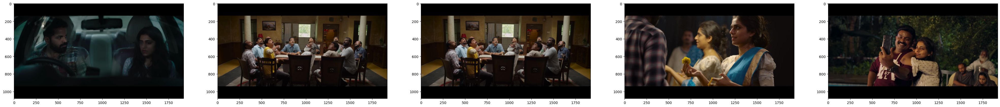

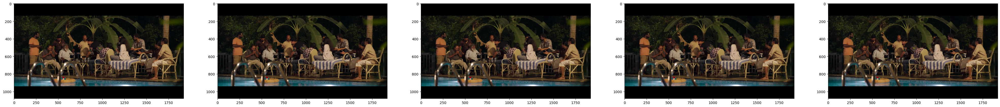

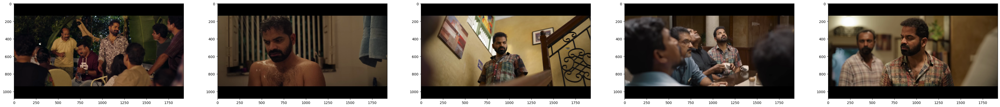

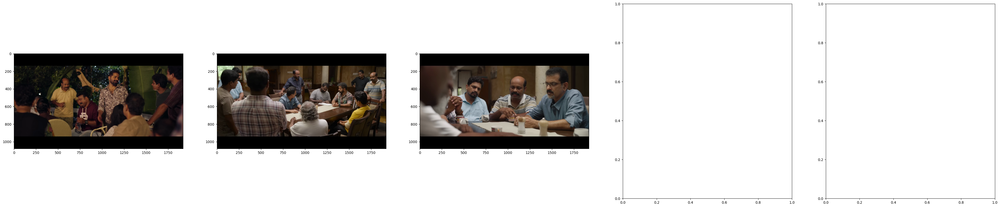

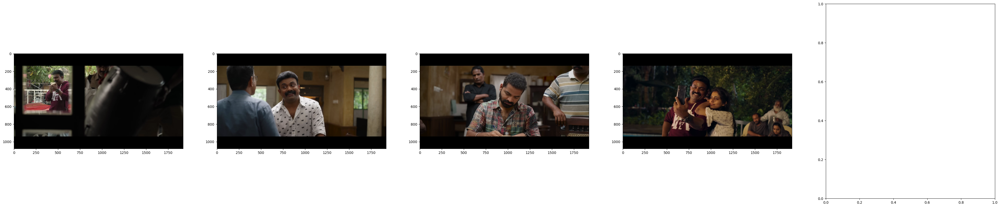

...

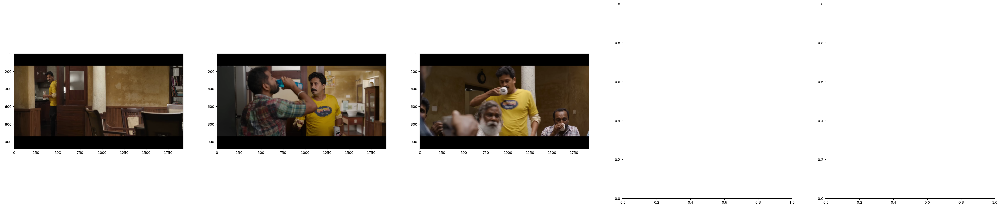

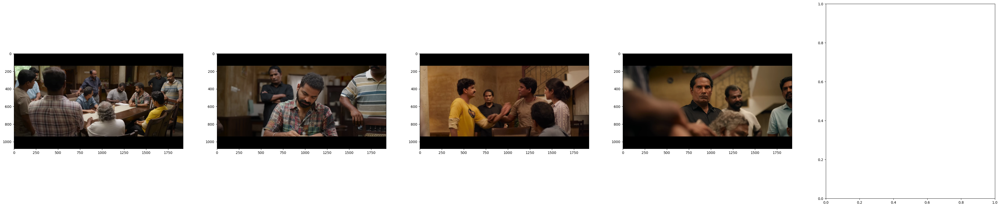

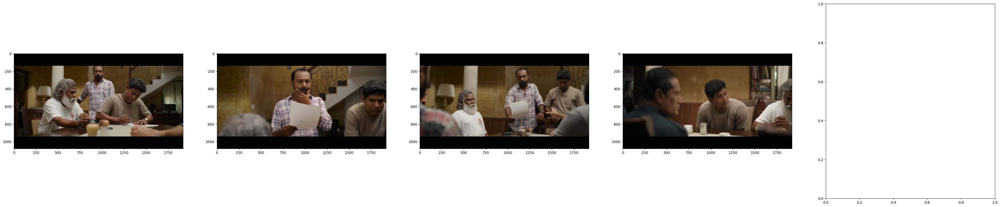

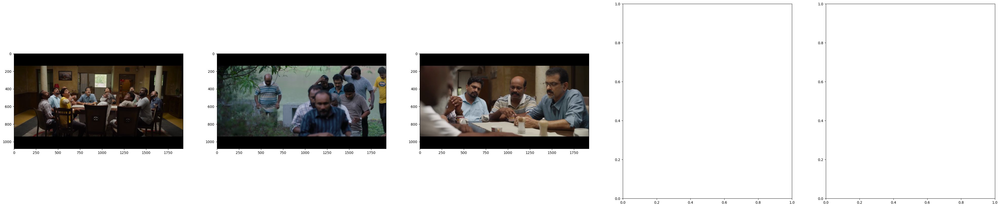

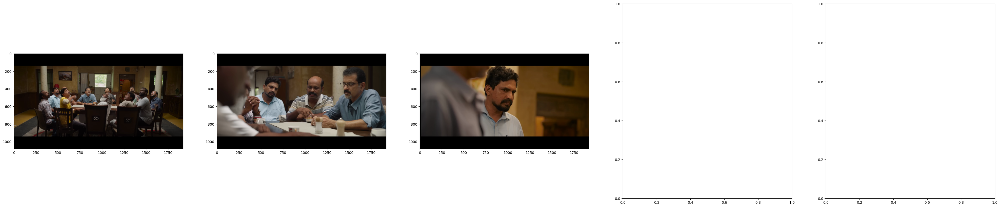

In [266]:
for cluster_id, face_ids in face_clusters.items():
    fig, axs = plt.subplots(1,5, figsize=(50, 10))
    for ax, fid in zip(axs, face_ids[:10]):
        ax.imshow(frames[face_id_scene[fid]])

In [249]:
encodings[2]

array([  -0.060615,    0.081119,     0.13266,   -0.024263,    -0.08054,   -0.047833,    0.017161,    -0.10744,    0.069468,    -0.04629,     0.25413,   -0.084204,     -0.1896,   -0.094906,  7.5634e-05,     0.14193,    -0.16328,    -0.14435,   -0.054116,   -0.082339,    0.021684,    0.026799,    0.024807,    0.058805,
          -0.10717,    -0.32127,   -0.064958,    -0.09771,    0.040875,   -0.045375,   0.0028099,     0.12315,    -0.22798,   -0.022402,    0.030475,   0.0059349,   -0.028695,    -0.10112,     0.13107,    0.047057,    -0.14709,   -0.036382, -0.00094948,     0.29103,     0.16232,    0.032848,   -0.024598,    0.020356,
          0.024713,    -0.24261,    0.006813,      0.1761,    0.033788,    0.052305,    0.044788,     -0.1231,    0.097761,    0.034816,    -0.16687,    0.017836,    0.060465,    -0.11626,  -0.0013389,   -0.079858,     0.22565,    0.091991,   -0.060226,   -0.080747,      0.1266,   -0.083939,   -0.052195,    0.044961,
          -0.15336,    -0.13503,    -0.1945

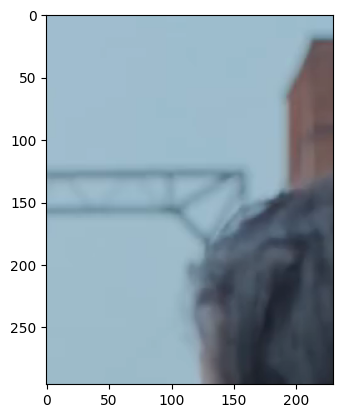

In [250]:
import face_recognition

x1,y1, x2,y2, *_ = detected_faces[34]
plt.imshow(frames[30][round(y1):round(y2), round(x1):round(x2)])

[encoding1] = face_recognition.face_encodings(frames[30], [(int(y1), int(x2), int(y2), int(x1))])

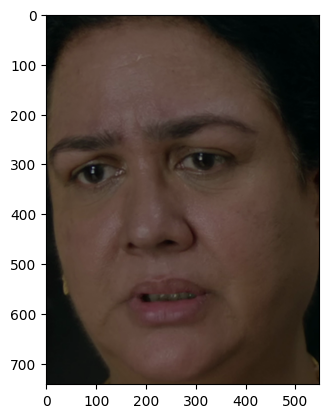

In [212]:
import face_recognition

x1,y1, x2,y2, *_ = detected_faces[68]
plt.imshow(frames[60][round(y1):round(y2), round(x1):round(x2)])

[encoding2] = face_recognition.face_encodings(frames[60], [(int(y1), int(x2), int(y2), int(x1))])

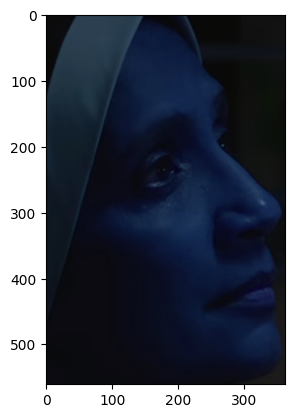

In [213]:
import face_recognition

x1,y1, x2,y2, *_ = detected_faces[82]
plt.imshow(cv2.cvtColor(
    frames[75][round(y1):round(y2), round(x1):round(x2)],
cv2.COLOR_BGR2RGB))
[encoding3] = face_recognition.face_encodings(frames[75], [(int(y1), int(x2), int(y2), int(x1))])

In [214]:
face_recognition.compare_faces([encoding3, encoding1], encoding2)

[False, True]

In [79]:
def detect_and_draw_persons(frame):
    results = model(frame)
    detections = results[0].boxes.data.cpu().numpy()
    
    for det in detections:
        x1, y1, x2, y2, conf, class_id = det
        if results[0].names[int(class_id)] == 'Human face':
            if conf < 0.5:
                continue
            # Draw rectangle
            cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
            # Add label
            label = f'Person: {conf:.2f}'
            print(label)
            cv2.putText(frame, label, (int(x1), int(y1)-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)
    
    return frame, len([d for d in detections if results[0].names[int(d[5])] == 'person'])

In [80]:
detected, thing = detect_and_draw_persons(frame)


0: 288x640 1 Human face, 64.3ms
Speed: 8.1ms preprocess, 64.3ms inference, 0.3ms postprocess per image at shape (1, 3, 288, 640)
Person: 0.84


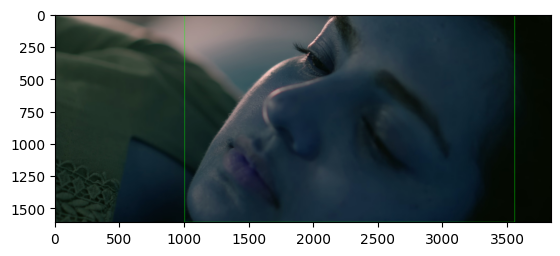

In [81]:
plt.imshow(detected)